In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Prime Librerie da importare**

In [ ]:
import cv2
import numpy as np
import dlib
import math
import os
from pathlib import Path

# Path principali delle cartelle in cui sono contenuti i file

In [ ]:
path_principale = "/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Gruppi/Gruppo 22/Progetto BABELE/"
path_train = "Train/"
path_test = "Test/"
path_validation = "Validation/"

# **Salvataggio lista di librerie e versioni installate**

In [ ]:
!pip freeze > "/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Gruppi/Gruppo 22/Progetto BABELE/requirements_estrazioneFeatures.txt"

# **Creazioni directory importanti per il progetto**

In [ ]:
# Funzione per creare una directory se non esiste già
def create_directory_if_not_exists(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

# Creazione delle directory principali
create_directory_if_not_exists(path_principale + "CSV_DATASET")
create_directory_if_not_exists(path_principale + "CSV_DATASET_MERGED")
create_directory_if_not_exists(path_principale + "CSV_DATASET_SVD")
create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT")
create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT_MERGED")
create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT_SVD")
create_directory_if_not_exists(path_principale + "CSV_DATASET_CH-SIMS_CMU-MOSEI")
create_directory_if_not_exists(path_principale + "FILE_PATH")

# Creazione delle sotto-directory per train, test e validation
create_directory_if_not_exists(path_principale + "CSV_DATASET/" + path_train)
create_directory_if_not_exists(path_principale + "CSV_DATASET/" + path_test)
create_directory_if_not_exists(path_principale + "CSV_DATASET/" + path_validation)

create_directory_if_not_exists(path_principale + "CSV_DATASET_MERGED/" + path_train)
create_directory_if_not_exists(path_principale + "CSV_DATASET_MERGED/" + path_test)
create_directory_if_not_exists(path_principale + "CSV_DATASET_MERGED/" + path_validation)

create_directory_if_not_exists(path_principale + "CSV_DATASET_SVD/" + path_train)
create_directory_if_not_exists(path_principale + "CSV_DATASET_SVD/" + path_test)
create_directory_if_not_exists(path_principale + "CSV_DATASET_SVD/" + path_validation)

create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT/" + path_train)
create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT/" + path_test)
create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT/" + path_validation)

create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT_MERGED/" + path_train)
create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT_MERGED/" + path_test)
create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT_MERGED/" + path_validation)

create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT_SVD/" + path_train)
create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT_SVD/" + path_test)
create_directory_if_not_exists(path_principale + "CSV_PNN_RESULT_SVD/" + path_validation)

create_directory_if_not_exists(path_principale + "CSV_DATASET_CH-SIMS_CMU-MOSEI/" + path_train)
create_directory_if_not_exists(path_principale + "CSV_DATASET_CH-SIMS_CMU-MOSEI/" + path_test)

create_directory_if_not_exists(path_principale + "CSV_DATASET_OPTICAL_FLOW/" + path_train)
create_directory_if_not_exists(path_principale + "CSV_DATASET_OPTICAL_FLOW/" + path_test)
create_directory_if_not_exists(path_principale + "CSV_DATASET_OPTICAL_FLOW/" + path_validation)

create_directory_if_not_exists(path_principale + "CSV_DATASET_OPTICAL_FLOW/" + path_train + "TWO_FRAME/")
create_directory_if_not_exists(path_principale + "CSV_DATASET_OPTICAL_FLOW/" + path_test + "TWO_FRAME/")
create_directory_if_not_exists(path_principale + "CSV_DATASET_OPTICAL_FLOW/" + path_validation + "TWO_FRAME/")

create_directory_if_not_exists(path_principale + "CSV_DATASET_OPTICAL_FLOW/" + path_train + "SEQUENCE/")
create_directory_if_not_exists(path_principale + "CSV_DATASET_OPTICAL_FLOW/" + path_test + "SEQUENCE/")
create_directory_if_not_exists(path_principale + "CSV_DATASET_OPTICAL_FLOW/" + path_validation + "SEQUENCE/")

create_directory_if_not_exists(path_principale + "FILE_PATH/" + path_train)
create_directory_if_not_exists(path_principale + "FILE_PATH/" + path_test)
create_directory_if_not_exists(path_principale + "FILE_PATH/" + path_validation)

# **Funzione per toglierre i NaN**


In [ ]:
import pandas as pd


# Funzione che riempie i valori NaN con la media mobile calcolata su una finestra mobile di lunghezza n_frame
# Il tutto a condizione che ci siano almeno 2 valori non NaN nella finestra (min_periods)
def fill_nan(row, n_frame):
    return row.fillna(row.rolling(min_periods=2, window=n_frame).mean())

# Funzione per sostituire i valori NaN all'inizio del file
def remove_initial_nan(df):
  # Sostituzione dei valori NaN nelle colonne intermedie con la media dei successivi
  df_filled = df.copy()
  columns_to_fill = df.columns[1:-1]  # Seleziona tutte le colonne tranne la prima e l'ultima

  for column in columns_to_fill:
      df_filled[column].fillna(df_filled[column].fillna(method='ffill').shift(-1).mean(), inplace=True)
    
  return df_filled

# Funzione per rimuovere i valori NaN
def remove_nan(df,num_frames_per_second):
  df = remove_initial_nan(df)
  df = df.apply(fill_nan, axis=1, n_frame=num_frames_per_second) #Caso di NaN in altre posizioni

  return df

# Funzione per estrarre componente verticale e orizzontale dal flusso


Spiegazione paramaetri della funzione:
* prev_frame: È il frame precedente (o l'immagine precedente) dalla sequenza di input. Deve essere un'immagine in scala di grigi (un singolo canale).

* next_frame_gray: È il frame successivo (o l'immagine successiva) dalla sequenza di input. Anch'esso deve essere un'immagine in scala di grigi.

* prev_flow: Questo parametro può essere utilizzato per fornire un'ipotesi iniziale del flusso ottico. Se non si dispone di una stima iniziale, si può passare None.

* pyr_scale: È un parametro che specifica la scala dell'immagine per la piramide a livelli multipli. Di solito è impostato a 0.5, il che significa che ogni livello della piramide successivo è la metà delle dimensioni del livello precedente.

* levels: Rappresenta il numero di livelli nella piramide a livelli multipli utilizzata per il calcolo. Un numero tipico di livelli è 3.

* winsize: Specifica la dimensione della finestra di media mobile utilizzata per approssimare la derivata spaziale. Un valore comune è 15.

* iterations: Rappresenta il numero di iterazioni dell'algoritmo di ottimizzazione per ogni livello della piramide. Di solito si usa 3.

* poly_n: È il grado del polinomio espanso per approssimare la distribuzione dei pixel circostanti. Un valore tipico è 5.

* poly_sigma: Specifica la deviazione standard del kernel gaussiano usato per approssimare le derivate spaziali. Un valore comune è 1.2.

* flags: Sono dei flag opzionali che possono essere utilizzati per modificare il comportamento dell'algoritmo. In questo caso, il valore 0 indica l'uso delle impostazioni predefinite.

* flow: Questo è il parametro di output in cui verrà restituito il flusso ottico calcolato dall'algoritmo.

## Definizione parametri del flusso ottico

In [ ]:
prev_flow=None
pyr_scale = 0.5
levels = 3
winsize = 15
iterations = 3
poly_n = 5
poly_sigma = 1.2
flags = 0

## Estrazione componente verticale e orizzontale tra due frame consecutivi

In [ ]:
def calcola_feature_flusso_ottico_tra_due_frame(prev_frame, next_frame_gray, prev_flow=None ):

  flusso = cv2.calcOpticalFlowFarneback(prev_frame, next_frame_gray,prev_flow, pyr_scale,
                                      levels, winsize,iterations, poly_n, poly_sigma, flags)


  # Estrai le componenti orizzontali e verticali del flusso ottico 
  # (se un valore è negativo vuol dire che la direzione della labbra dal frame precedente è cambiata
  flusso_orizzontale = flusso[:, :, 0]  # Componente orizzontale del flusso ottico
  flusso_verticale = flusso[:, :, 1]  # Componente verticale del flusso ottico

  # Calcola le medie delle componenti orizzontali e verticali
  media_orizzontale = np.mean(flusso_orizzontale)
  media_verticale = np.mean(flusso_verticale)

  #print("Media della componente orizzontale:", mean_horizontal)
  #print("Media della componente verticale:", mean_vertical)

  return {'media_orizzontale':media_orizzontale,'media_verticale':media_verticale }

In [ ]:
def calcola_flusso_ottico_sequenza(sequence, prev_flow=None):
    # Converti il primo frame in scala di grigi
    prev_frame_gray = sequence[0]
    # Inizializza il flusso ottico accumulato
    flusso_accumulato = None

    # Itera attraverso la sequenza a partire dal secondo frame
    for i in range(1, len(sequence)):
        # Converti il frame corrente in scala di grigi
        next_frame_gray = sequence[i]

        # Calcola il flusso ottico tra il frame precedente e il frame corrente
        flusso = cv2.calcOpticalFlowFarneback(prev_frame, next_frame_gray,prev_flow, pyr_scale,
                                      levels, winsize,iterations, poly_n, poly_sigma, flags)

        # Accumula il flusso ottico
        if flusso_accumulato is None:
            flusso_accumulato = flusso
        else:
            flusso_accumulato += flusso

        # Imposta il frame corrente come frame precedente per la prossima iterazione
        prev_frame_gray = next_frame_gray

    # Estrai le componenti orizzontali e verticali del flusso ottico
    flusso_orizzontale = flusso_accumulato[:, :, 0]  # Componente orizzontale del flusso ottico
    flusso_verticale = flusso_accumulato[:, :, 1]  # Componente verticale del flusso ottico

    # Calcola la media delle componenti orizzontali e verticali
    media_orizzontale = np.mean(flusso_orizzontale)
    media_verticale = np.mean(flusso_verticale)

    return {'media_orizzontale':media_orizzontale,'media_verticale':media_verticale }

# **Generazione dei file in cui saranno contenute le path dei video**

## Creazione file path video Babele per optical flow

In [ ]:
import os
import glob

# cartella contenente la path del dataset
dataset_path = "/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Datasets/Dataset_2_BABELE/BABELE_Dataset/Dataset_split_subject_independent/Lips_video_10_seconds_division_train_test_val"

# cartella in cui salvare i file
folder_save = "/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Gruppi/Gruppo 22/Progetto BABELE/FILE_PATH"

# Loop over all subfolders in folder_read
for subfolder in os.listdir(dataset_path):
    # Create a file with the subfolder's name in folder_save
    file_path = os.path.join(folder_save, subfolder + "_babele.txt")
    
    # Open the file for writing
    with open(file_path, "w") as f:
        # Get a list of all files in the subfolder
        files = glob.glob(os.path.join(dataset_path, subfolder, "*"))
        
        # Write each file's path to the file
        for file in files:
            f.write(file + "\n")

# Generazione dataset con Optical Flow

## Lista contenente le path dei video

In [ ]:
files_path = ["/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Gruppi/Gruppo 22/Progetto BABELE/FILE_PATH/Test_babele_lips.txt",
              "/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Gruppi/Gruppo 22/Progetto BABELE/FILE_PATH/Validation_babele_lips.txt",
              "/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Gruppi/Gruppo 22/Progetto BABELE/FILE_PATH/Train_babele_lips.txt"
              ]

## Estrazione e generazione dataset con le feature estratte tramite Optical Flow analizzando due frame successivi

In [ ]:
import cv2
import pandas as pd
import os
from tqdm import tqdm

fps = 24
num_frames = 240
num_frames_per_second = 6
num_seconds = num_frames // fps


for path_file in files_path:

  with open(path_file, mode='r') as file:

    video_data = []  # Lista di tutti i dati dei video
    
    linee = file.readlines()

    csv_filename = os.path.basename(path_file)
    csv_filename_without_extension = csv_filename.split(".")[0] #per la creazione del dataset voglio un nome senza .txt
    estensione = "_optical_flow_two_consecutive_frame.csv"
    path_flow = "TWO_FRAME/"

    if "Validation" in path_file:
      csv_path = path_principale+"CSV_DATASET_OPTICAL_FLOW/"+path_validation +path_flow + csv_filename_without_extension + estensione
    elif "Train" in path_file:
      csv_path = path_principale+"CSV_DATASET_OPTICAL_FLOW/"+path_train + path_flow+csv_filename_without_extension + estensione
    elif "Test" in path_file:
       csv_path = path_principale+"CSV_DATASET_OPTICAL_FLOW/"+path_test +path_flow+ csv_filename_without_extension + estensione
    else:
      print("Qualcosa è andato storto!")
      break

    for video_path in tqdm(linee, desc="Elaborazione video " + csv_filename_without_extension, unit="video"):
        video_path = video_path.strip() # Rimuovi il carattere di a capo dalla stringa

        # Apre il video in input
        cap = cv2.VideoCapture(str(video_path))

        # Leggo il primo frame
        ret, prev_frame = cap.read()
        prev_frame = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

        filename = os.path.basename(video_path) #Nome del file video
        filename_without_extension = filename.split(".")[0] #per la creazione del dataset voglio un nome senza .avi
        components = filename.split("_")[:-1] #splitto l'array in un altro per "_" e elimino ".avi"
       
        target = int(components[0]) #Estrazione classe (lingua)

        # Inizializza la lista dei dati del video
        video_data_video = []

        # Loop attraverso tutti i frame del video
        frame_count = 0
        frame_data = {}
        #nome del frame
        frame_data['video-frame'] = filename_without_extension # Alla fine collego al nome del file il frame analizzato
        colonna = 0

        while cap.isOpened() and frame_count < 240:
            
            ret, next_frame = cap.read()

            if not ret:
                break
          
            # Converte l'immagine in RGB
            next_frame = cv2.cvtColor(next_frame, cv2.COLOR_BGR2GRAY)
            
            if next_frame is None:
              print("Frame errato, la funzione cv2.COLOR_BGR2GRAY non è stata in grado di convertire l'immagine in RGB")
              frame_count += 1
              continue
            else:
              flows = calcola_feature_flusso_ottico_tra_due_frame(prev_frame, next_frame)
              # Salva il frame corrente come frame precedente per il prossimo ciclo
              prev_frame = next_frame


              frame_data['media_orizzontale'+str(colonna)]= flows['media_orizzontale']
              frame_data['media_verticale'+str(colonna)]= flows['media_verticale']

              frame_count += 1
              colonna += 1 

        frame_data['target']=  target
        
        # Aggiungi il dizionario alla lista dei dati del video
        video_data_video.append(frame_data)

        # Aggiungi i dati del video alla lista di tutti i dati
        video_data.extend(video_data_video)

        # Chiudi il video
        cap.release()

    # Crea il dataframe dai dati di tutti i video e visualizzalo
    df = pd.DataFrame(video_data)

    # Visualizza il DataFrame
    display(df)

    print(100*"-")
    print("Generazione del file csv ", csv_filename_without_extension, estensione)
    print(100*"-")
    df.to_csv(csv_path, index=False)

    file.close()


## Estrazione e generazione dataset cone le feature estratte tramite Optical Flow analizzando una sequenza di frame successivi (nel nostro caso 24 frame)

In [ ]:
import cv2
import pandas as pd
import os
from tqdm import tqdm


numeri_di_frame_da_analizzare = [24]

for numeri_frame in numeri_di_frame_da_analizzare:
  for path_file in files_path:

    with open(path_file, mode='r') as file:

      video_data = []  # Lista di tutti i dati dei video
      
      linee = file.readlines()

      csv_filename = os.path.basename(path_file)
      csv_filename_without_extension = csv_filename.split(".")[0] #per la creazione del dataset voglio un nome senza .txt
      estensione = "_optical_flow_sequence_frame_"+str(numeri_frame)+".csv"
      path_flow = "SEQUENCE/"

      if "Validation" in path_file:
        csv_path = path_principale+"CSV_DATASET_OPTICAL_FLOW/"+path_validation +path_flow + csv_filename_without_extension + estensione
      elif "Train" in path_file:
        csv_path = path_principale+"CSV_DATASET_OPTICAL_FLOW/"+path_train + path_flow+csv_filename_without_extension + estensione
      elif "Test" in path_file:
        csv_path = path_principale+"CSV_DATASET_OPTICAL_FLOW/"+path_test +path_flow+ csv_filename_without_extension + estensione
      else:
        print("Qualcosa è andato storto!")
        break

      for video_path in tqdm(linee, desc="Elaborazione video " + csv_filename_without_extension, unit="video"):
          video_path = video_path.strip() # Rimuovi il carattere di a capo dalla stringa

          # Apre il video in input
          cap = cv2.VideoCapture(str(video_path))

          # Leggo il primo frame
          ret, prev_frame = cap.read()
          prev_frame = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

          filename = os.path.basename(video_path) #Nome del file video
          filename_without_extension = filename.split(".")[0] #per la creazione del dataset voglio un nome senza .avi
          components = filename.split("_")[:-1] #splitto l'array in un altro per "_" e elimino ".avi"
        
          target = int(components[0]) #Estrazione classe (lingua)

          # Inizializza la lista dei dati del video
          video_data_video = []

          # Loop attraverso tutti i frame del video
          frame_count = 0
          frame_data = {}
          #nome del frame
          frame_data['video-frame'] = filename_without_extension # Alla fine collego al nome del file il frame analizzato
          colonna = 0

          sequence = []
          sequence.append(prev_frame)

          while cap.isOpened() and frame_count < 240:
              
              ret, next_frame = cap.read()

              if not ret:
                  break
            
              # Converte l'immagine in RGB
              next_frame = cv2.cvtColor(next_frame, cv2.COLOR_BGR2GRAY)
              
              if next_frame is None:
                print("Frame errato, la funzione cv2.COLOR_BGR2GRAY non è stata in grado di convertire l'immagine in RGB")
                frame_count += 1
                continue
              else:
                sequence.append(next_frame)  # Aggiungi il frame corrente alla sequenza
                frame_count += 1
                if len(sequence) == numeri_frame:
                  flows = calcola_flusso_ottico_sequenza(sequence)

                  # Salva le medie delle componenti orizzontali e verticali
                  frame_data['media_orizzontale'+str(colonna)]= flows['media_orizzontale']
                  frame_data['media_verticale'+str(colonna)]= flows['media_verticale']

                  
                  colonna += 1
                  sequence =[]

          frame_data['target']=  target
          
          # Aggiungi il dizionario alla lista dei dati del video
          video_data_video.append(frame_data)

          # Aggiungi i dati del video alla lista di tutti i dati
          video_data.extend(video_data_video)

          # Chiudi il video
          cap.release()

      # Crea il dataframe dai dati di tutti i video e visualizzalo
      df = pd.DataFrame(video_data)

      # Visualizza il DataFrame
      display(df)

      print(100*"-")
      print("Generazione del file csv ", csv_filename_without_extension, estensione)
      print(100*"-")
      df.to_csv(csv_path, index=False)

      file.close()


# Test tentativo disegno zona individuata con optical flow solo con le labbra

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# Path to the video file
video_path = "/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Datasets/Dataset_2_BABELE/BABELE_Dataset/Dataset_split_subject_independent/Lips_video_10_seconds_division_train_test_val/Test/1_1_1_11_30_1_m.avi"

#video_path = "/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Datasets/Dataset_2_BABELE/BABELE_Dataset/Dataset_split_subject_independent/Full_video_10_seconds_division_train_test_val/Test/1_1_1_11_30_1.avi"


# Create a VideoCapture object
cap = cv2.VideoCapture(video_path)
# Parameters for Lucas-Kanade optical flow
lk_params = dict(winSize=(15, 15),
                 maxLevel=2,
                 criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

# Initialize previous frame and previous points
prev_frame = None
prev_points = None

while True:
    # Read frame from video
    ret, frame = cap.read()
    
    if not ret:
        break
    
    # Apply noise reduction
    frame = cv2.fastNlMeansDenoisingColored(frame, None, 10, 10, 7, 21)
    
    # Convert frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    if prev_frame is None:
        prev_frame = gray
        prev_points = cv2.goodFeaturesToTrack(prev_frame, maxCorners=100, qualityLevel=0.3,
                                              minDistance=7, blockSize=7)
        continue
    
    # Calculate optical flow
    next_points, status, _ = cv2.calcOpticalFlowPyrLK(prev_frame, gray, prev_points, None, **lk_params)
    
    # Filter out points with low status
    good_points = next_points[status == 1]
    
    # Find the bounding box for the lip region
    x, y, w, h = cv2.boundingRect(good_points)
    
    # Draw bounding box on the frame
    cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)
    
    # Convert BGR to RGB for displaying with Matplotlib
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Display the frame using Matplotlib
    plt.imshow(frame_rgb)
    plt.axis('off')
    plt.show()
    
    # Update previous frame and points
    prev_frame = gray.copy()
    prev_points = good_points.reshape(-1, 1, 2)
    
    # Exit if 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the video capture and close all windows
cap.release()
cv2.destroyAllWindows()

# Test tentativo disegno zona individuata con optical flow con video completi

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# Path to the video file
#video_path = "/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Datasets/Dataset_2_BABELE/BABELE_Dataset/Dataset_split_subject_independent/Lips_video_10_seconds_division_train_test_val/Test/1_1_1_11_30_1_m.avi"

video_path = "/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Datasets/Dataset_2_BABELE/BABELE_Dataset/Dataset_split_subject_independent/Full_video_10_seconds_division_train_test_val/Test/1_1_1_11_30_1.avi"


# Create a VideoCapture object
cap = cv2.VideoCapture(video_path)
# Parameters for Lucas-Kanade optical flow
lk_params = dict(winSize=(15, 15),
                 maxLevel=2,
                 criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

# Initialize previous frame and previous points
prev_frame = None
prev_points = None

while True:
    # Read frame from video
    ret, frame = cap.read()
    
    if not ret:
        break
    
    # Apply noise reduction
    frame = cv2.fastNlMeansDenoisingColored(frame, None, 10, 10, 7, 21)
    
    # Convert frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    if prev_frame is None:
        prev_frame = gray
        prev_points = cv2.goodFeaturesToTrack(prev_frame, maxCorners=100, qualityLevel=0.3,
                                              minDistance=7, blockSize=7)
        continue
    
    # Calculate optical flow
    next_points, status, _ = cv2.calcOpticalFlowPyrLK(prev_frame, gray, prev_points, None, **lk_params)
    
    # Filter out points with low status
    good_points = next_points[status == 1]
    
    # Find the bounding box for the lip region
    x, y, w, h = cv2.boundingRect(good_points)
    
    # Draw bounding box on the frame
    cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)
    
    # Convert BGR to RGB for displaying with Matplotlib
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Display the frame using Matplotlib
    plt.imshow(frame_rgb)
    plt.axis('off')
    plt.show()
    
    # Update previous frame and points
    prev_frame = gray.copy()
    prev_points = good_points.reshape(-1, 1, 2)
    
    # Exit if 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the video capture and close all windows
cap.release()
cv2.destroyAllWindows()

# Test tentativo disegno zona individuata con optical flow video completi (tracciamento linea sull'oggetto in movimento)

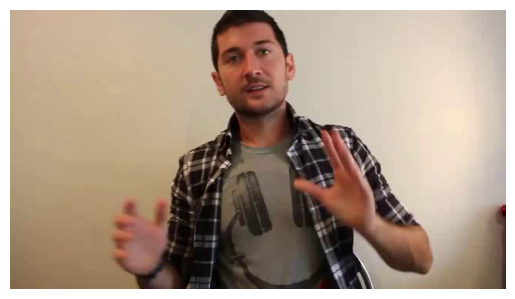

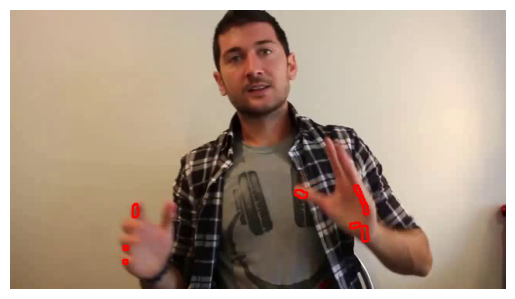

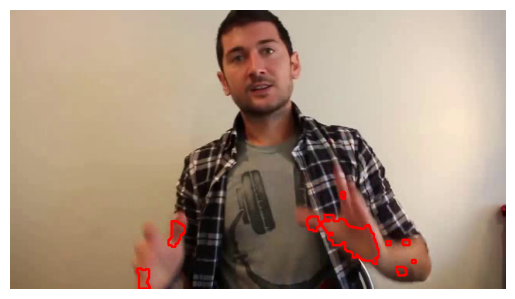

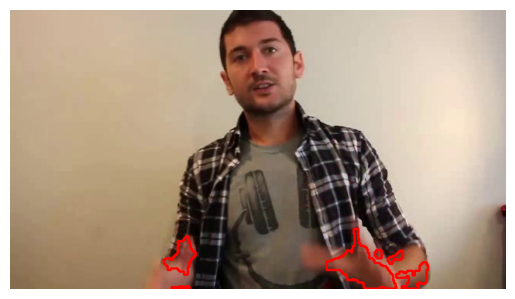

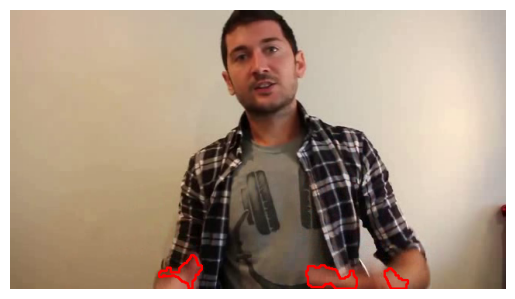

...

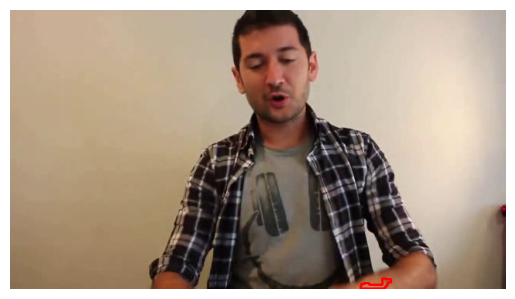

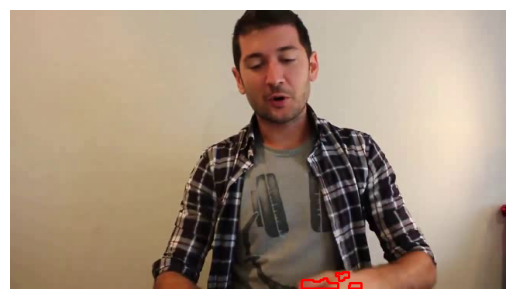

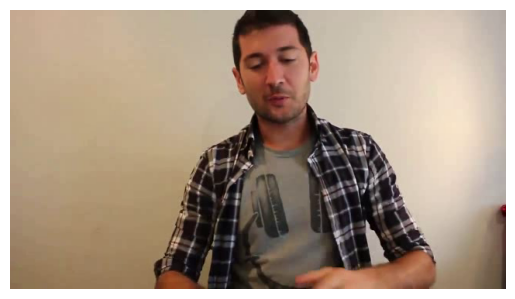

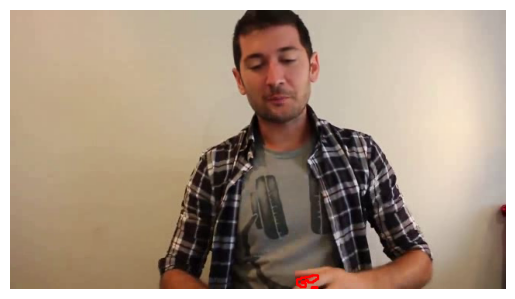

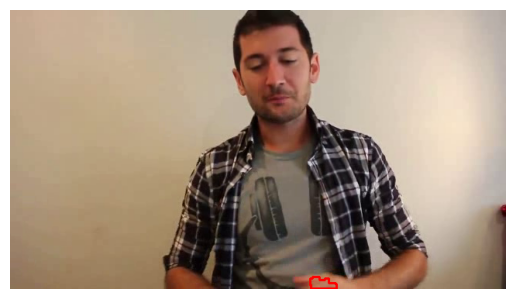

KeyboardInterrupt: ignored

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Path to the video file
video_path = "/content/drive/Shareddrives/Progetti FVAB 22 23 - VSR & BABELE/Datasets/Dataset_2_BABELE/BABELE_Dataset/Dataset_split_subject_independent/Full_video_10_seconds_division_train_test_val/Test/1_1_1_11_30_1.avi"


# Create a VideoCapture object
cap = cv2.VideoCapture(video_path)

# Initialize variables for optical flow
prev_frame = None
prev_gray = None

while True:
    # Read the current frame from the video
    ret, frame = cap.read()

    if not ret:
        break

    # Convert the frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    if prev_frame is not None:
        # Calculate optical flow between the previous and current frame
        flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

        # Compute the magnitude and angle of the optical flow vectors
        magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

        # Threshold the magnitude to extract strong optical flow regions (lips)
        threshold = 10  # Adjust this threshold based on your requirements
        lips_mask = cv2.threshold(magnitude, threshold, 255, cv2.THRESH_BINARY)[1]

        # Apply color segmentation to the lips mask
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        lower_lip = np.array([0, 120, 70], dtype=np.uint8)
        upper_lip = np.array([10, 255, 255], dtype=np.uint8)
        lip_mask = cv2.inRange(hsv, lower_lip, upper_lip)

        # Combine the optical flow mask and color segmentation mask
        lips_mask = cv2.bitwise_and(lips_mask, lips_mask, mask=lip_mask)

        # Apply morphological operations to remove noise
        kernel = np.ones((5, 5), np.uint8)
        lips_mask = cv2.morphologyEx(lips_mask, cv2.MORPH_OPEN, kernel)

        # Convert the lips mask to the required format
        if cv2.__version__.startswith('4'):
            lips_mask = np.uint8(lips_mask)
        else:
            lips_mask = np.uint8(lips_mask) * 255

        # Find contours in the lips mask
        contours, _ = cv2.findContours(lips_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Draw the contours on the frame
        cv2.drawContours(frame, contours, -1, (0, 0, 255), 2)

    # Display the frame with the lip extraction
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

    # Update the previous frame and grayscale image
    prev_frame = frame
    prev_gray = gray

# Release the video capture
cap.release()